#### Name: Rajnita Leichombam
#### USC-ID : 1370432160
#### Github-Username: Rajnita

# HOMEWORK - 6

(a)
Download the APS Failure data from:
https://archive.ics.uci.edu/ml/datasets/
APS+Failure+at+Scania+Trucks
. The dataset contains a training set and a test
set. The training set contains 60,000 rows, of which 1,000 belong to the positive
class and 171 columns, of which one is the class column. All attributes are nu-
meric.

The data is downloaded and put under ../data folder

(b)
Data Preparation
This data set has
missing values
. When the number of data with missing values
is significant, discarding them is not a good idea <br>

i.
Research what types of techniques are usually used for dealing with data with
missing values.
2
Pick at least one of them and apply it to this data in the
next steps.


In [14]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, mean_squared_error
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline, make_pipeline
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')

In [2]:
raw_train_df=pd.read_csv('../data/aps_failure_training_set.csv', skiprows=20)
raw_test_df=pd.read_csv('../data/aps_failure_test_set.csv', skiprows=20)

In [3]:
raw_train_df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,na,664,186,0,0,0,0,0,...,998500,566884,1290398,1218244,1019768,717762,898642,28588,0,0
59996,neg,2286,na,2130706538,224,0,0,0,0,0,...,10578,6760,21126,68424,136,0,0,0,0,0
59997,neg,112,0,2130706432,18,0,0,0,0,0,...,792,386,452,144,146,2622,0,0,0,0
59998,neg,80292,na,2130706432,494,0,0,0,0,0,...,699352,222654,347378,225724,194440,165070,802280,388422,0,0


In [4]:
raw_test_df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,na,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,neg,1814,na,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,na,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,neg,79636,na,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,neg,110,na,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


## Replacing raw data with NaN

In [3]:
merged_raw_data=pd.concat([raw_train_df,raw_test_df],ignore_index=True)
merged_raw_data.replace({'na':np.nan,'neg':0, 'pos':1}, inplace=True)
all_columns=merged_raw_data.columns
features=all_columns.drop('class')
merged_raw_data

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0,76698,NaN,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,0,33058,NaN,0,NaN,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,0,41040,NaN,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,0,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,0,60874,NaN,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,0,81852,NaN,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
75996,0,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
75997,0,79636,NaN,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
75998,0,110,NaN,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


## Imputing the data - handling missing values


Usually, we split the data and then impute. Here for simplicity, I have combined the raw train set and test set, imputed on the whole dataset, then splitted into imputed train set and imputed test setfor future processing

### Techniques to deal with missing values
I have listed below some of the ways to deal with missing value <br>

Delete the rows or columns with missing values<br>
Replace the missing values with statistics like mean, mode, median, previous val, next value (forward and backward fill), randomly selected val, etc.<br>
Missing values can also be imputed using algorithms like KNN i.e. KNN imputer, iterative imputer<br>
Fill by predicting the missing values using techniques like linear regression- replace the nulls in the feature with missing data,  using other available features.<br>

Here for future processing, I am using MEAN as a technique to fill in missing values.

In [4]:
imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
imp_mean.fit(merged_raw_data)

imputed_merged_data = pd.DataFrame(imp_mean.transform(merged_raw_data))
imputed_merged_data.columns=all_columns

## Splitting test and train data

In [7]:
features

Index(['aa_000', 'ab_000', 'ac_000', 'ad_000', 'ae_000', 'af_000', 'ag_000',
       'ag_001', 'ag_002', 'ag_003',
       ...
       'ee_002', 'ee_003', 'ee_004', 'ee_005', 'ee_006', 'ee_007', 'ee_008',
       'ee_009', 'ef_000', 'eg_000'],
      dtype='object', length=170)

In [5]:
imputed_train_set=imputed_merged_data[:60000]
imputed_test_set=imputed_merged_data[60000:]

imputed_trainX=imputed_train_set[features]
imputed_trainY=imputed_train_set['class']
imputed_testX=imputed_test_set[features]
imputed_testY=imputed_test_set['class']

print("TEST SET")
imputed_test_set

TEST SET


,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
60000,0.0,60.0,0.00000,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
60001,0.0,82.0,0.00000,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
60002,0.0,66002.0,2.00000,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
60003,0.0,59816.0,0.72556,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
60004,0.0,1814.0,0.72556,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,0.0,81852.0,0.72556,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
75996,0.0,18.0,0.00000,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
75997,0.0,79636.0,0.72556,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
75998,0.0,110.0,0.72556,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


In [9]:
print("TRAIN SET")
imputed_train_set

TRAIN SET


,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,0.0,76698.0,0.72556,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,0.0,33058.0,0.72556,0.000000e+00,150629.962105,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,0.0,41040.0,0.72556,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,0.0,12.0,0.00000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,0.0,60874.0,0.72556,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.0,153002.0,0.72556,6.640000e+02,186.000000,0.0,0.0,0.0,0.0,0.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,0.0,2286.0,0.72556,2.130707e+09,224.000000,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,0.0,112.0,0.00000,2.130706e+09,18.000000,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,0.0,80292.0,0.72556,2.130706e+09,494.000000,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


ii.
For each of the 170 features, calculate the coefficient of variation
CV
=
s/m
,
where
s
is sample standard deviation and
m
is sample mean.

In [10]:
CV_for_features = {}
for feature in features:
    feature_data = imputed_merged_data[feature]
    std = feature_data.std()
    mean = feature_data.mean()
    cv=std/mean
    CV_for_features[feature] = cv
    
print('COEFFICIENT OF VARIATION')
cv_df=pd.DataFrame(CV_for_features.items(), columns=['Feature', 'Coefficient_of_variation'])

with pd.option_context('display.max_rows', None,):
    print(cv_df)

COEFFICIENT OF VARIATION
    Feature  Coefficient_of_variation
0    aa_000                  4.328608
1    ab_000                  2.178273
2    ac_000                  2.167653
3    ad_000                206.721500
4    ae_000                 22.293670
5    af_000                 18.209016
6    ag_000                 91.460654
7    ag_001                 42.084343
8    ag_002                 17.625909
9    ag_003                  8.753300
10   ag_004                  5.475116
11   ag_005                  2.964230
12   ag_006                  2.352588
13   ag_007                  2.812498
14   ag_008                  6.274980
15   ag_009                 32.167057
16   ah_000                  2.315540
17   ai_000                 18.506308
18   aj_000                 43.144480
19   ak_000                 78.622988
20   al_000                  9.111991
21     am_0                  9.067195
22   an_000                  2.254227
23   ao_000                  2.276114
24   ap_000              


iii. Plot a correlation matrix for your features using pandas or any other tool.

In [11]:
import warnings
warnings.filterwarnings('ignore')
correlation = imputed_merged_data[features].corr()
correlation.style.background_gradient(cmap='coolwarm')

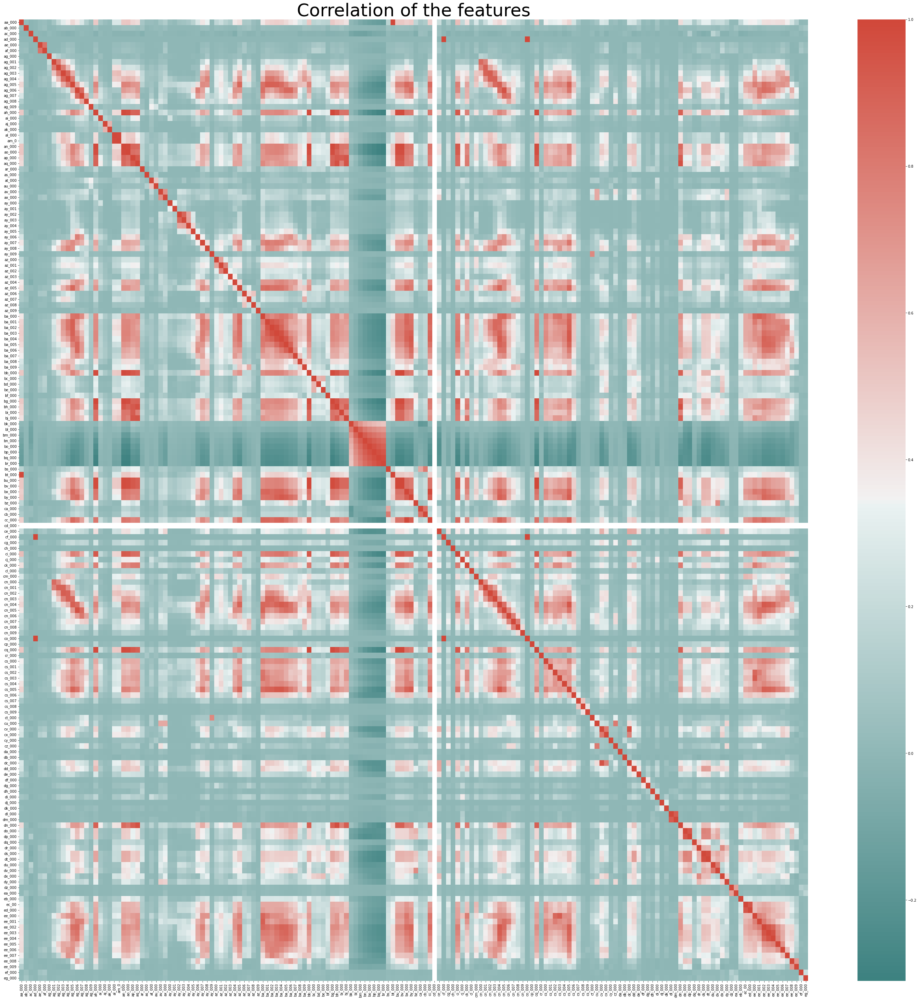

In [12]:
f, ax = plt.subplots(figsize=(50, 50))
plt.title("Correlation of the features",size=50)
sns.heatmap(correlation, 
            xticklabels=correlation.columns.values,
            yticklabels=correlation.columns.values,ax=ax, cmap=sns.diverging_palette(190, 15, as_cmap=True))
plt.show()

iv.
Pick
floor
√
170
c
features with highest
CV
, and make scatter plots and box plots
for them, similar to those on p. 129 of ISLR. Can you draw conclusions about
significance of those features, just by the scatter plots? This does not mean
that you will only use those features in the following questions. We picked
them only for visualization.

In [13]:
num_of_top_features = np.floor(np.sqrt(170)).astype(int)
sorted_cv = sorted(CV_for_features.items(), key=lambda x: x[1], reverse=True)
print("*******Sorted CVs**********")
sorted_cv

*******Sorted CVs**********


[('cf_000', 207.2702736886315),
 ('co_000', 206.87612939952814),
 ('ad_000', 206.72149958176453),
 ('cs_009', 192.52261084543085),
 ('dj_000', 122.12815277529702),
 ('as_000', 113.88275538316807),
 ('dh_000', 112.65245027418743),
 ('df_000', 111.36966565765684),
 ('ag_000', 91.46065359583645),
 ('au_000', 86.0856375114368),
 ('ak_000', 78.62298773590766),
 ('az_009', 77.99955638588112),
 ('ay_009', 77.46110130112072),
 ('ch_000', 57.497904275433314),
 ('cs_008', 57.20236013802887),
 ('dz_000', 49.24880589355106),
 ('ay_001', 49.248634585265535),
 ('ef_000', 47.91954361933018),
 ('eg_000', 45.6509500471785),
 ('aj_000', 43.14447956358556),
 ('ag_001', 42.08434252956986),
 ('ay_000', 40.902518755773826),
 ('ay_002', 38.34231917467728),
 ('dl_000', 37.456646665790714),
 ('dk_000', 36.518036906388474),
 ('dg_000', 34.67660328861543),
 ('dm_000', 34.55180169618035),
 ('ay_004', 33.040131957282725),
 ('ea_000', 32.77726962041257),
 ('ag_009', 32.16705734053676),
 ('cn_009', 30.96133556224176

In [14]:
print("##########Top",num_of_top_features, "features###########")
for i in range(0, num_of_top_features):
    print(sorted_cv[i][0],':',sorted_cv[i][1])

##########Top 13 features###########
cf_000 : 207.2702736886315
co_000 : 206.87612939952814
ad_000 : 206.72149958176453
cs_009 : 192.52261084543085
dj_000 : 122.12815277529702
as_000 : 113.88275538316807
dh_000 : 112.65245027418743
df_000 : 111.36966565765684
ag_000 : 91.46065359583645
au_000 : 86.0856375114368
ak_000 : 78.62298773590766
az_009 : 77.99955638588112
ay_009 : 77.46110130112072


In [15]:
top_13_df = pd.DataFrame()
for i in range(0, num_of_top_features):
    feature_data = imputed_merged_data[sorted_cv[i][0]]
    top_13_df = pd.concat([top_13_df, feature_data], axis=1)
top_13_df = pd.concat([top_13_df,imputed_merged_data['class'] ], axis=1)
top_13_df

,cf_000,co_000,ad_000,cs_009,dj_000,as_000,dh_000,df_000,ag_000,au_000,ak_000,az_009,ay_009,class
0,2.000000,220.000000,280.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,150231.156793,150517.375485,150629.962105,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.000000,100.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.000000,2.000000,66.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,202.000000,458.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,2.000000,42.000000,892.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75996,2.000000,0.000000,46.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75997,2.000000,378.000000,1518.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75998,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Scatter Plot for features with highest Coefficient of variation

SCATTER PLOT : features with highest Coefficient of variation


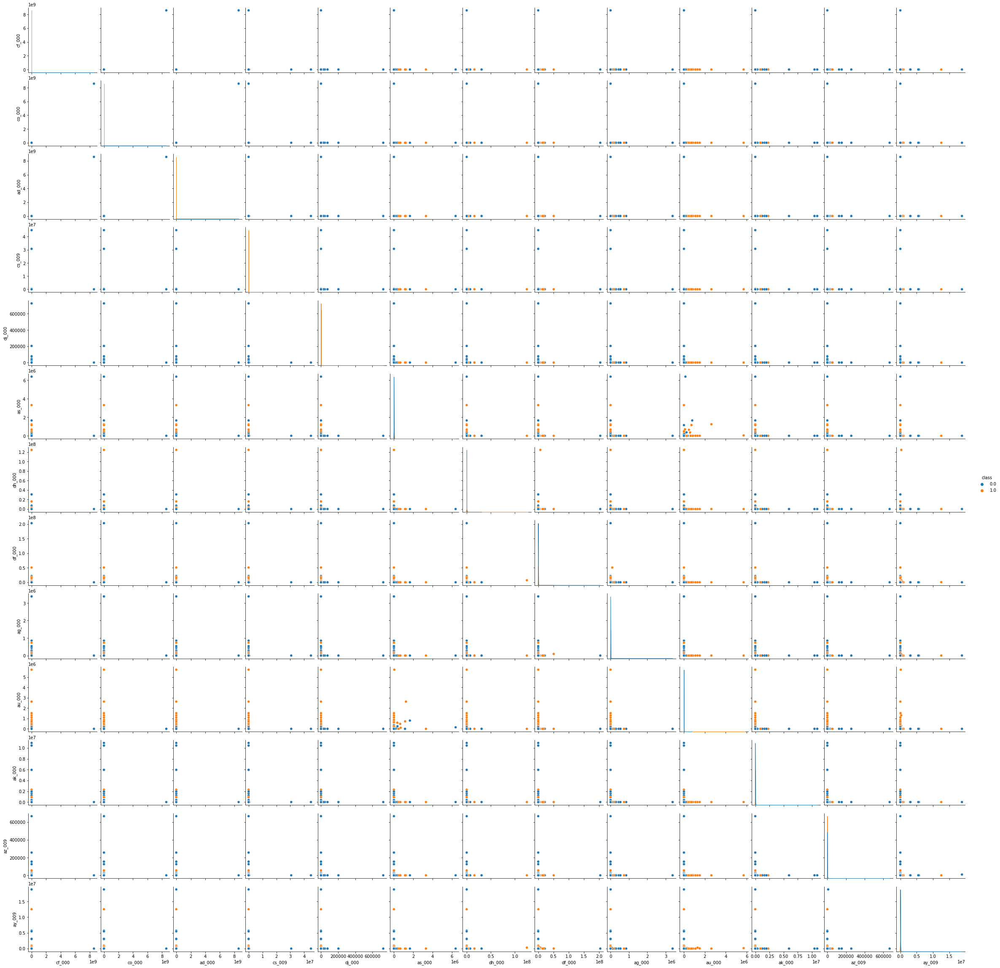

In [16]:
print("SCATTER PLOT : features with highest Coefficient of variation")

##This is without HUE  as target class. This process took a lot of time. Hence I added Hue as Class. 

##sns.pairplot(top_13_df_downsample)

## for testig with downsampling
# top_13_df_downsample=top_13_df.sample(frac=0.5, random_state=1,ignore_index=True)
# print("Scatter")
# sns.pairplot(top_13_df_downsample, hue='class')

sns.pairplot(top_13_df, hue='class')

## Observations

Seeing au_000 relation with other features from the pairplot, class=1 i.e. positive (in orange) take slightly higher vals of au_000 compared to those data point with class=0 (blue). <br>
In some of the pairplots (dj_000 & cf_000 , dj_000 &co_000,dj_000 &ad_000), not much datapoints of class 1(orange) is seen in the pairplot and is dominated by class=0 (blue). These features may not be very significant in predicting the target output value, although it is hard to judge just by scatter plots.<br>
Also it is clear that there is a clear class imbalance on observing the diagonal in the pair plot

## Box Plot for features with highest Coefficient of variation

BOX PLOT OF THE TOP CV FEATURES


<AxesSubplot:>

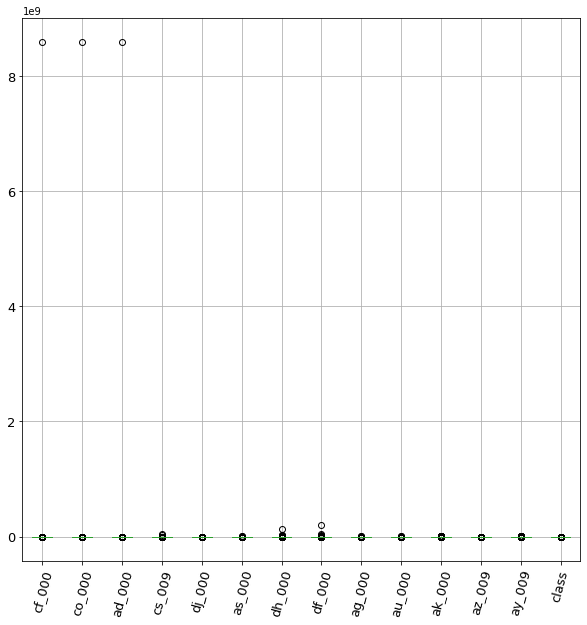

In [17]:
print('BOX PLOT OF THE TOP CV FEATURES')

top_13_df.boxplot(rot=75,fontsize=13, figsize=(10, 10))

## Boxplot for the 13 features distinguished by class

In [18]:
top_13_df

,cf_000,co_000,ad_000,cs_009,dj_000,as_000,dh_000,df_000,ag_000,au_000,ak_000,az_009,ay_009,class
0,2.000000,220.000000,280.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,150231.156793,150517.375485,150629.962105,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.000000,100.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.000000,2.000000,66.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,202.000000,458.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75995,2.000000,42.000000,892.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75996,2.000000,0.000000,46.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75997,2.000000,378.000000,1518.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75998,0.000000,0.000000,32.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


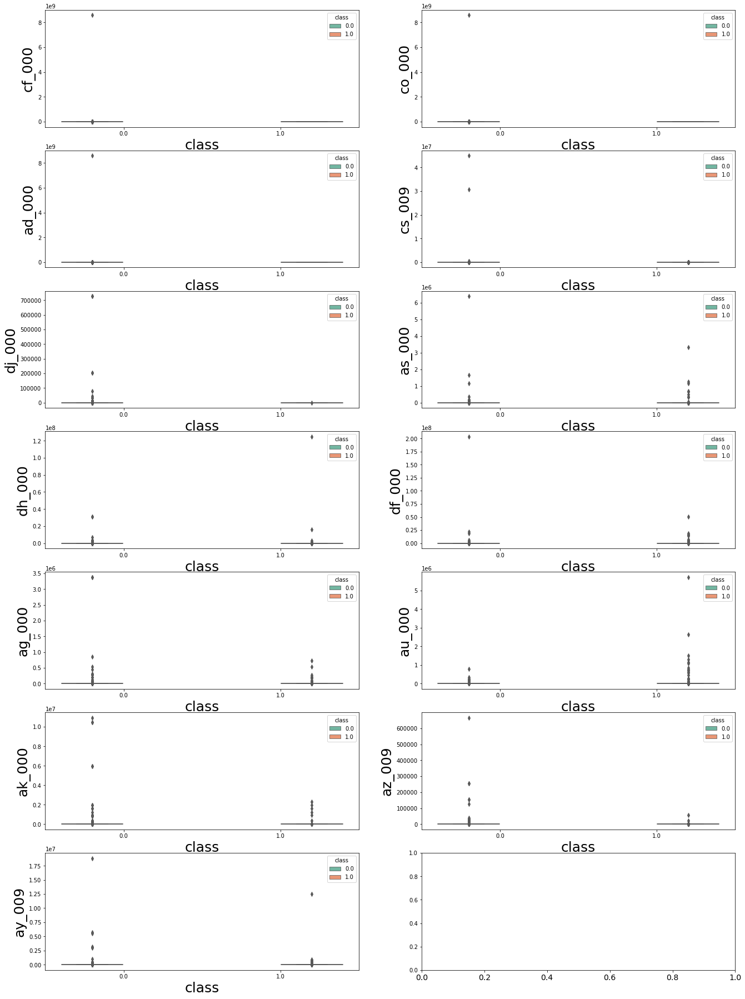

In [19]:
f, axes = plt.subplots(7, 2)
f.subplots_adjust(bottom=1, right=3, top=7)
df=top_13_df.copy()
top_13=top_13_df.columns[:13]

ax1=sns.boxplot(x="class", y=top_13[0], hue="class",
                 data=df, palette="Set2",ax=axes[0][0])
ax1.xaxis.label.set_size(25)
ax1.yaxis.label.set_size(25)

ax2=sns.boxplot(x="class", y=top_13[1], hue="class",
                 data=df, palette="Set2",ax=axes[0][1])
ax2.xaxis.label.set_size(25)
ax2.yaxis.label.set_size(25)

ax3=sns.boxplot(x="class", y=top_13[2], hue="class",
                 data=df, palette="Set2",ax=axes[1][0])
ax3.xaxis.label.set_size(25)
ax3.yaxis.label.set_size(25)

ax4=sns.boxplot(x="class", y=top_13[3], hue="class",
                 data=df, palette="Set2",ax=axes[1][1])
ax4.xaxis.label.set_size(25)
ax4.yaxis.label.set_size(25)

ax5=sns.boxplot(x="class", y=top_13[4], hue="class",
                 data=df, palette="Set2",ax=axes[2][0])
ax5.xaxis.label.set_size(25)
ax5.yaxis.label.set_size(25)

ax6=sns.boxplot(x="class", y=top_13[5], hue="class",
                 data=df, palette="Set2",ax=axes[2][1])
ax6.xaxis.label.set_size(25)
ax6.yaxis.label.set_size(25)

ax7=sns.boxplot(x="class", y=top_13[6], hue="class",
                 data=df, palette="Set2",ax=axes[3][0])
ax7.xaxis.label.set_size(25)
ax7.yaxis.label.set_size(25)

ax8=sns.boxplot(x="class", y=top_13[7], hue="class",
                 data=df, palette="Set2",ax=axes[3][1])
ax8.xaxis.label.set_size(25)
ax8.yaxis.label.set_size(25)

ax9=sns.boxplot(x="class", y=top_13[8], hue="class",
                 data=df, palette="Set2",ax=axes[4][0])
ax9.xaxis.label.set_size(25)
ax9.yaxis.label.set_size(25)


ax10=sns.boxplot(x="class", y=top_13[9], hue="class",
                 data=df, palette="Set2",ax=axes[4][1])
ax10.xaxis.label.set_size(25)
ax10.yaxis.label.set_size(25)

ax11=sns.boxplot(x="class", y=top_13[10], hue="class",
                 data=df, palette="Set2",ax=axes[5][0])
ax11.xaxis.label.set_size(25)
ax11.yaxis.label.set_size(25)

ax12=sns.boxplot(x="class", y=top_13[11], hue="class",
                 data=df, palette="Set2",ax=axes[5][1])
ax12.xaxis.label.set_size(25)
ax12.yaxis.label.set_size(25)

ax13=sns.boxplot(x="class", y=top_13[12], hue="class",
                 data=df, palette="Set2",ax=axes[6][0])
ax13.xaxis.label.set_size(25)
ax13.yaxis.label.set_size(25)



plt.xticks(fontsize=14)

plt.show()


## OBSERVATIONS

From the box plot above, we can see some outlifers in the data.<br>
dj_000 and co_000, the datapoints are in class 0 mostly.

v.
Determine the number of positive and negative data. Is this data set imbalanced?

In [20]:
total_pos_train=0;
total_neg_train=0;

for target_val in imputed_trainY:
    if target_val==0:
        total_pos_train+=1;
    else:
        total_neg_train+=1;
        
total_pos_test=0;
total_neg_test=0;
for target_val in imputed_testY:
    if target_val==0:
        total_pos_test+=1;
    else:
        total_neg_test+=1;
print("TRAIN DATA: Total positive=", total_pos_train, "and total negatives=", total_neg_train)
print("TEST DATA: Total positive=", total_pos_test, "and total negatives=", total_neg_test)
print("WHOLE DATA SET positive=", total_pos_train+total_pos_test, "and total negatives=", total_neg_train+total_neg_test)


TRAIN DATA: Total positive= 59000 and total negatives= 1000
TEST DATA: Total positive= 15625 and total negatives= 375
WHOLE DATA SET positive= 74625 and total negatives= 1375


## Observations

##### We can see that in the train data set, there are a total 59000 positives, 1000 negatives. Clearly there is a data imbalance.
##### Moreover, even in the test dataset, there is an imbalance since there is only 375 negatives and 15625 positives.
##### The whole dataset thus reflects the data imbalance, as seen in train and test set

(c)
Train a random forest to classify the data set. Do NOT compensate for class
imbalance in the data set. Calculate the confusion matrix, ROC, AUC, and
misclassification for training and test sets and report them (You may use pROC
package). Calculate Out of Bag error estimate for your random forset and compare
it to the test error.

## Building Random Forest Classifier

In [21]:
rfm = RandomForestClassifier(n_estimators=100,oob_score = True, n_jobs=-1, random_state=16)
rfm = rfm.fit(imputed_trainX, imputed_trainY)

rf_train_PredY = rfm.predict(imputed_trainX)
rf_test_PredY = rfm.predict(imputed_testX)


## Random Forest Classifier - Report

RANDOM FOREST MODEL - IMBALANCED CLASSES
Train Accuracy: 1.0
Test Accuracy: 0.9923125
Train Error - Misclassification rate :  0.0
Test Error - Misclassification rate :  0.007687499999999958

TRAIN DATA : Confusion Matrix
[[59000     0]
 [    0  1000]]


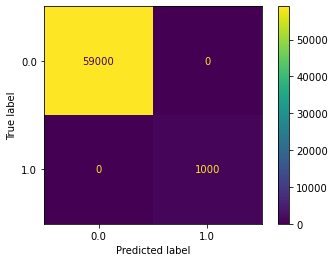

TEST DATA : Confusion Matrix
[[15609    16]
 [  107   268]]


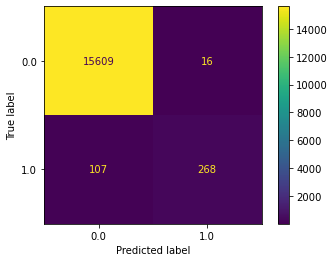


TRAIN DATA - Total misclassifications: 0
TEST DATA - Total misclassifications: 123
TRAIN DATA-Misclassification rate 0.0
TEST DATA-Misclassification rate 0.0076875

Out of the bag error: 0.006033333333333335


In [22]:
def printStats(imputed_trainY,train_PredY,imputed_testY, test_PredY,model): 
    rf_train_accuracy = accuracy_score(imputed_trainY, train_PredY)
    rf_test_accuracy = accuracy_score(imputed_testY, test_PredY)
    print("Train Accuracy:",rf_train_accuracy)
    print("Test Accuracy:",rf_test_accuracy)
    print("Train Error - Misclassification rate : ", 1-rf_train_accuracy)
    print("Test Error - Misclassification rate : ", 1-rf_test_accuracy)

    rf_train_cm = confusion_matrix(imputed_trainY, train_PredY)
    rf_train_TN, rf_train_FP, rf_train_FN, rf_train_TP = rf_train_cm.ravel()
    print("\nTRAIN DATA : Confusion Matrix")
    print(rf_train_cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=rf_train_cm,display_labels=model.classes_)
    disp.plot()
    plt.show()

    rf_test_cm = confusion_matrix(imputed_testY, test_PredY)
    rf_test_TN, rf_test_FP, rf_test_FN, rf_test_TP = rf_test_cm.ravel()
    print("TEST DATA : Confusion Matrix")
    print(rf_test_cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=rf_test_cm,display_labels=model.classes_)
    disp.plot()
    plt.show()

    tr_mc=rf_train_FP+rf_train_FN
    te_mc=rf_test_FP+rf_test_FN
    print("\nTRAIN DATA - Total misclassifications:",tr_mc)
    print("TEST DATA - Total misclassifications:",te_mc)

    print("TRAIN DATA-Misclassification rate",tr_mc/(rf_train_TN+rf_train_FP+rf_train_FN+rf_train_TP))
    print("TEST DATA-Misclassification rate",te_mc/(rf_test_TN+rf_test_FP+rf_test_FN+rf_test_TP))
    

print("RANDOM FOREST MODEL - IMBALANCED CLASSES")
printStats(imputed_trainY,rf_train_PredY,imputed_testY, rf_test_PredY,rfm)
oob_error = 1-rfm.oob_score_
print('\nOut of the bag error:', oob_error)

## Random Forest Classifier - ROC Curve

In [23]:
rf_train_PredY_prob = rfm.predict_proba(imputed_trainX)
rf_test_PredY_prob = rfm.predict_proba(imputed_testX)

RANDOM FOREST MODEL - IMBALANCED CLASSES


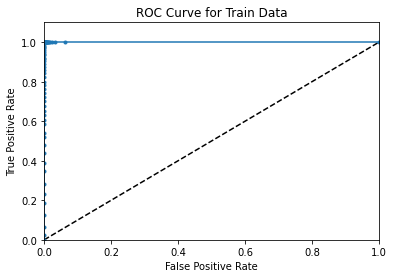

AUC for TRAIN DATA: 1.0


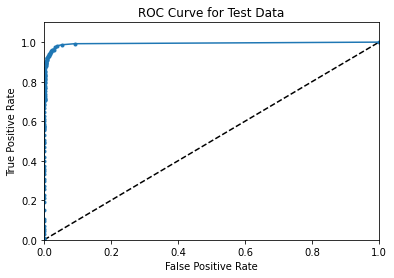

AUC for TEST DATA: 0.993


In [24]:
def plot_roc_auc(imputed_trainY,rf_train_PredY_prob,imputed_testY, rf_test_PredY_prob):
    rf_tr_fpr,rf_tr_tpr,threshold = roc_curve(imputed_trainY,rf_train_PredY_prob[:, 1])
    rf_train_auc = round(roc_auc_score(imputed_trainY,rf_train_PredY_prob[:, 1]), 3)
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.plot(rf_tr_fpr,rf_tr_tpr,marker='.')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.1])
    plt.title("ROC Curve for Train Data")
    plt.show()
    print("AUC for TRAIN DATA:", rf_train_auc)

    rf_te_fpr,rf_te_tpr,threshold = roc_curve(imputed_testY,rf_test_PredY_prob[:, 1])
    rf_test_auc = round(roc_auc_score(imputed_testY,rf_test_PredY_prob[:, 1]), 3)
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.plot(rf_te_fpr,rf_te_tpr,marker='.')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.1])
    plt.title("ROC Curve for Test Data")
    plt.show()
    print("AUC for TEST DATA:", rf_test_auc)

print("RANDOM FOREST MODEL - IMBALANCED CLASSES")

plot_roc_auc(imputed_trainY,rf_train_PredY_prob,imputed_testY, rf_test_PredY_prob)

## OBSERVATION


#### OOB error is slightly lesser than test error.
#### We can see that, out of the bag error is close to the test error. Thus, we can say that using OOB error, we can get an approximation of the expected error from our classifier, i.e. a good estimate of error for unseen data.



(d)
Research how class imbalance is addressed in random forests. Compensate for
class imbalance in your random forest and repeat 2c. Compare the results with
those of 2c.

## Random Forest Classifier with Class Weight - handling class imbalance

In [25]:
balanced_rfm = RandomForestClassifier(n_estimators=100,class_weight='balanced', oob_score = True,n_jobs=-1, random_state=16)
balanced_rfm = balanced_rfm.fit(imputed_trainX, imputed_trainY)

balanced_rf_train_PredY = balanced_rfm.predict(imputed_trainX)
balanced_rf_test_PredY = balanced_rfm.predict(imputed_testX)

## Random Forest Classifier with Class Weight - Report

RANDOM FOREST MODEL - BALANCED CLASSES
Train Accuracy: 1.0
Test Accuracy: 0.9889375
Train Error - Misclassification rate :  0.0
Test Error - Misclassification rate :  0.011062499999999975

TRAIN DATA : Confusion Matrix
[[59000     0]
 [    0  1000]]


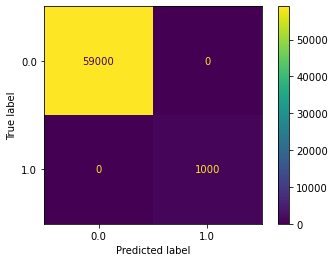

TEST DATA : Confusion Matrix
[[15612    13]
 [  164   211]]


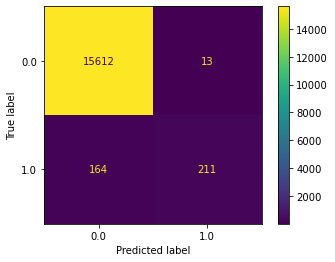


TRAIN DATA - Total misclassifications: 0
TEST DATA - Total misclassifications: 177
TRAIN DATA-Misclassification rate 0.0
TEST DATA-Misclassification rate 0.0110625

 Balanced - Out of the bag error: 0.007600000000000051


In [26]:
print("RANDOM FOREST MODEL - BALANCED CLASSES")
printStats(imputed_trainY,balanced_rf_train_PredY,imputed_testY, balanced_rf_test_PredY, balanced_rfm)
bal_oob_error = 1-balanced_rfm.oob_score_
print('\n Balanced - Out of the bag error:', bal_oob_error)

In [27]:
balanced_rf_train_PredY_prob = balanced_rfm.predict_proba(imputed_trainX)
balanced_rf_test_PredY_prob = balanced_rfm.predict_proba(imputed_testX)

RANDOM FOREST MODEL - BALANCED CLASSES


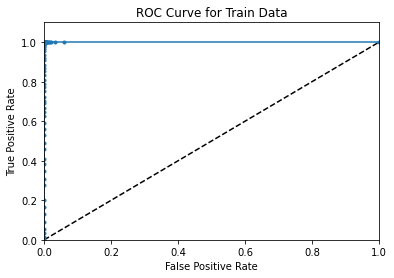

AUC for TRAIN DATA: 1.0


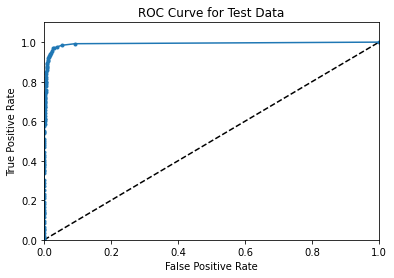

AUC for TEST DATA: 0.992


In [28]:
print("RANDOM FOREST MODEL - BALANCED CLASSES")
plot_roc_auc(imputed_trainY,balanced_rf_train_PredY_prob,imputed_testY, balanced_rf_test_PredY_prob)

## OBSERVATIONS

#### As seen above, the AUC for train data is 1 in both models ( class balanced model and class imbalanced model). AUC for test data is similar, slightly lower (very small difference)  in one with classWeight as 'balanced'.
#### For this test set, the test accuracy with imbalanced class  data is slightly better. However, if we consider multiple diverse test sets, the test accuracy for the balanced model would be much better, since the model is balanced (i.e. trained with balanced class data)

#### I have also tried different ways to deal with class imbalance in Random forest model. They are present after the  REFERENCES section at the end of the notebook

(e)
XGBoost and Model Trees
1
In reality, wehn we have a model and we want to fill in missing values, we do not have access to training
data, so we only use the statistics of test data to fill in the missing values. For simplicity, in this exercise,
you first fill in the missing values and then split your data to training and test sets.
2
They are called data imputation techniques.
3
You are welcome to test more than one method.

In the case of a univariate tree, only one input dimension is used at a tree split.
In a multivariate tree, or model tree, at a decision node all input dimensions can
be used and thus it is more general. In univariate classification trees, majority
polling is used at each node to determine the split of that node as the decision
rule. In model trees, a (linear) model that relies on all of the variables is used
to determine the split of that node (i.e. instead of using
X
j
s
as the decision
rule, one has
P
j
β
j
X
j
s
. as the decision rule). Alternatively, in a regression
tree, instead of using average in the region associated with each node, a linear
regression model is used to determine the value associated with that node.
One of the methods that can be used at each node is Logistic Regression. Because
the number of variables is large in this problem, one can use
L
1
-penalized logistic
regression at each node. You can use XGBoost to fit the model tree. Determine
α
(the regularization term) using cross-validation. Train the model for the APS
data set without compensation for class imbalance. Use one of 5 fold, 10 fold,
and leave-one-out cross validation methods to estimate the error of your trained
model and compare it with the test error. Report the Confusion Matrix, ROC,
and AUC for training and test sets.

## XGBClassifier - Imbalanced classes

### Grid Search CV with cv=5

In [29]:
clf=XGBClassifier( objective='binary:logistic',random_state=10, n_estimators=100,verbosity=0, eval_metric='logloss', use_label_encoder=False)
alphas = [1e-3,0.01, 0.05, 0.1, 0.2,0.75,1,1.2,1.5,10,100]
params = {
    'reg_alpha':alphas
}
gsv = GridSearchCV(clf,param_grid=params,cv=5,scoring='roc_auc', n_jobs=-1,return_train_score=True)
gsv.fit(imputed_trainX,imputed_trainY)
print("Grid Search results:")
print("Best params:",gsv.best_params_ )

Grid Search results:
Best params: {'reg_alpha': 1}


In [30]:
print("Grid Search - best mean cross validation Score is ",gsv.best_score_)
print("Grid Search -  mean cross validation error is ",np.round(1-gsv.best_score_,4))
best_alpha = gsv.best_params_['reg_alpha']
print("Best alpha:", best_alpha)

xgb_pred_tr_y= gsv.predict(imputed_trainX)
xgb_pred_te_y= gsv.predict(imputed_testX)

train_accuracy = accuracy_score(imputed_trainY,xgb_pred_tr_y)
test_accuracy = accuracy_score(imputed_testY,xgb_pred_te_y)

print("\nXGB CLASSIFIER - WITHOUT SMOTE - WITH BEST ALPHA VAL")
test_score = gsv.score(imputed_testX,imputed_testY)
print("Test Score:", test_score)
print("Test Error:",np.round(1- test_score,3))
print("Train Accuracy:",train_accuracy)
print("Test Accuracy:",test_accuracy)
print("Train Error:",np.round(1-train_accuracy,5))
print("Test Error:",np.round(1-test_accuracy,5))


Grid Search - best mean cross validation Score is  0.9909211016949152
Grid Search -  mean cross validation error is  0.0091
Best alpha: 1

XGB CLASSIFIER - WITHOUT SMOTE - WITH BEST ALPHA VAL
Test Score: 0.9955106133333333
Test Error: 0.004
Train Accuracy: 0.9999833333333333
Test Accuracy: 0.9945625
Train Error: 2e-05
Test Error: 0.00544


## OBSERVATIONS - XGB Classifier without SMOTE

We can see that the train model error and test error aren't significantly different. Given below is the confusion matrix and the ROC AUC CUrve

Train Accuracy: 0.9999833333333333
Test Accuracy: 0.9945625
Train Error - Misclassification rate :  1.67e-05
Test Error - Misclassification rate :  0.005437499999999984

TRAIN DATA : Confusion Matrix
[[59000     0]
 [    1   999]]


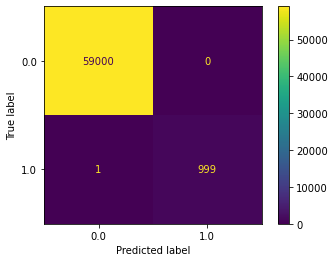

TEST DATA : Confusion Matrix
[[15613    12]
 [   75   300]]


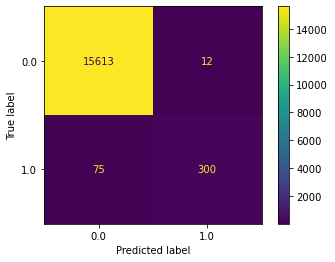


TRAIN DATA - Total misclassifications: 1
TEST DATA - Total misclassifications: 87
TRAIN DATA-Misclassification rate 1.67e-05
TEST DATA-Misclassification rate 0.0054375


In [31]:
 def printStats_XGB(imputed_trainY,xgb_train_PredY,imputed_testY, xgb_test_PredY,model): 
    xgb_train_accuracy = accuracy_score(imputed_trainY, xgb_train_PredY)
    xgb_test_accuracy = accuracy_score(imputed_testY, xgb_test_PredY)
    print("Train Accuracy:",xgb_train_accuracy)
    print("Test Accuracy:",xgb_test_accuracy)
    print("Train Error - Misclassification rate : ", np.round(1-xgb_train_accuracy,7))
    print("Test Error - Misclassification rate : ", 1-xgb_test_accuracy)

    xgb_train_cm = confusion_matrix(imputed_trainY, xgb_train_PredY)
    xgb_train_TN, xgb_train_FP, xgb_train_FN, xgb_train_TP = xgb_train_cm.ravel()
    print("\nTRAIN DATA : Confusion Matrix")
    print(xgb_train_cm)

    disp = ConfusionMatrixDisplay(confusion_matrix= xgb_train_cm,display_labels=model.classes_)
    disp.plot()
    plt.show()

    
    xgb_test_cm = confusion_matrix(imputed_testY, xgb_test_PredY)
    xgb_test_TN, xgb_test_FP, xgb_test_FN, xgb_test_TP = xgb_test_cm.ravel()
    print("TEST DATA : Confusion Matrix")
    print(xgb_test_cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix= xgb_test_cm,display_labels=model.classes_)
    disp.plot()
    plt.show()

    tr_mc=xgb_train_FP+xgb_train_FN
    te_mc=xgb_test_FP+xgb_test_FN
    print("\nTRAIN DATA - Total misclassifications:",tr_mc)
    print("TEST DATA - Total misclassifications:",te_mc)

    print("TRAIN DATA-Misclassification rate",np.round(tr_mc/(xgb_train_TN+xgb_train_FP+xgb_train_FN+xgb_train_TP),7))
    print("TEST DATA-Misclassification rate",te_mc/(xgb_test_TN+xgb_test_FP+xgb_test_FN+xgb_test_TP))

printStats_XGB(imputed_trainY,xgb_pred_tr_y,imputed_testY,xgb_pred_te_y,gsv)

In [32]:
print(classification_report(imputed_testY,xgb_pred_te_y))
print(classification_report(imputed_trainY,xgb_pred_tr_y))
print("TRAIN DATA- F1 score", f1_score(imputed_trainY,xgb_pred_tr_y))
print("TEST DATA- F1 score", f1_score(imputed_testY,xgb_pred_te_y))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     15625
         1.0       0.96      0.80      0.87       375

    accuracy                           0.99     16000
   macro avg       0.98      0.90      0.94     16000
weighted avg       0.99      0.99      0.99     16000

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     59000
         1.0       1.00      1.00      1.00      1000

    accuracy                           1.00     60000
   macro avg       1.00      1.00      1.00     60000
weighted avg       1.00      1.00      1.00     60000

TRAIN DATA- F1 score 0.9994997498749374
TEST DATA- F1 score 0.8733624454148472


In [33]:
xgb_model_train_PredY_prob = gsv.predict_proba(imputed_trainX)
xgb_model_test_PredY_prob = gsv.predict_proba(imputed_testX)


XGB MODEL - IMBALANCED CLASSES


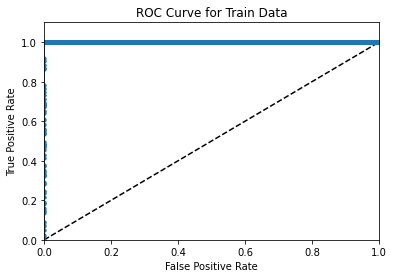

AUC for TRAIN DATA: 1.0


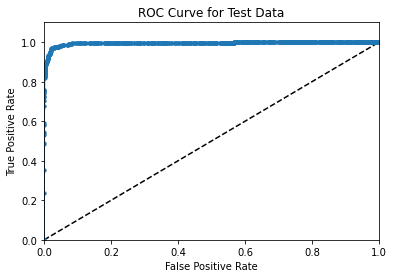

AUC for TEST DATA: 0.996


In [34]:
def plot_roc_auc(imputed_trainY,xgb_model_train_PredY_prob,imputed_testY, xgb_model_test_PredY_prob):
    xgb_tr_fpr,xgb_tr_tpr,threshold = roc_curve(imputed_trainY,xgb_model_train_PredY_prob[:, 1])
    xgb_train_auc = round(roc_auc_score(imputed_trainY,xgb_model_train_PredY_prob[:, 1]), 3)
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.plot(xgb_tr_fpr,xgb_tr_tpr,marker='.')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.1])
    plt.title("ROC Curve for Train Data")
    plt.show()
    print("AUC for TRAIN DATA:", xgb_train_auc)

    xgb_te_fpr,xgb_te_tpr,threshold = roc_curve(imputed_testY,xgb_model_test_PredY_prob[:,1])
    xgb_test_auc = round(roc_auc_score(imputed_testY,xgb_model_test_PredY_prob[:,1]), 3)
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.plot(xgb_te_fpr,xgb_te_tpr,marker='.')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.1])
    plt.title("ROC Curve for Test Data")
    plt.show()
    print("AUC for TEST DATA:", xgb_test_auc)

print("XGB MODEL - IMBALANCED CLASSES")

plot_roc_auc(imputed_trainY,xgb_model_train_PredY_prob,imputed_testY,xgb_model_test_PredY_prob)

(f)
Use SMOTE (Synthetic Minority Over-sampling Technique) to pre-process your
data to compensate for class imbalance.
4
Train XGBosst with
L
1
-penalized lo-
gistic regression at each node using the pre-processed data and repeat 1e. Do not
forget that there is a right and a wrong way of cross validation here. Compare
the uncompensated case with SMOTE case.

## XGBClassifier: using SMOTE

The right way to SMOTE is to make SMOTE as part of the cross validation process.
In the following method, I have used imblearn pipeline. A pipeline is created with SMOTE and the classifier. This pipeline is used in the GridCV process. So, SMOTE is applied to the train data only (leaving validation data) during the gridcv process ( cross validation)

In [10]:
xgbclassifier=XGBClassifier( objective='binary:logistic',random_state=10, n_estimators=100,verbosity=0,eval_metric='logloss', n_jobs=-1,use_label_encoder=False)
alphas = [1e-3,0.01, 0.05, 0.1, 0.2,0.75,1,1.2,1.5,10,100]
params = {
    'reg_alpha':alphas
}

new_params = {'xgbclassifier__' + key: params[key] for key in params}
imb_pipeline = make_pipeline(SMOTE(random_state=7),xgbclassifier)
print(imb_pipeline)

Pipeline(steps=[('smote', SMOTE(random_state=7)),
                ('xgbclassifier',
                 XGBClassifier(base_score=None, booster=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, enable_categorical=False,
                               eval_metric='logloss', gamma=None, gpu_id=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_delta_step=None, max_depth=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=-1, num_parallel_tree=None,
                               predictor=None, random_state=10, reg_alpha=None,
                               reg_lambda=None, scale_pos_weight=None,
                               subsample=None, tree_met

In [11]:
gsv_smote = GridSearchCV(imb_pipeline,param_grid=new_params,cv=5,scoring='roc_auc', return_train_score=True, n_jobs=-1)
gsv_smote.fit(imputed_trainX,imputed_trainY)
print("Grid Search results:")
print("Best params:",gsv_smote.best_params_ )


Grid Search results:
Best params: {'xgbclassifier__reg_alpha': 1}


In [12]:
print("Grid Search - best mean cross validation Score is ",gsv_smote.best_score_)
print("Grid Search -  mean cross validation error is ",np.round(1-gsv_smote.best_score_,4))
best_alpha = gsv_smote.best_params_['xgbclassifier__reg_alpha']
print("best alpha: ", best_alpha)

Grid Search - best mean cross validation Score is  0.9907805508474576
Grid Search -  mean cross validation error is  0.0092
best alpha:  1


In [21]:
xgb_pred_tr_y= gsv_smote.predict(imputed_trainX)
xgb_pred_te_y= gsv_smote.predict(imputed_testX)

##getting upsampled values, that is used in the gridcv pipeline
X_train_upsample, y_train_upsample = SMOTE(random_state=7).fit_resample(imputed_trainX, imputed_trainY)
xgb_pred_sm_tr_y= gsv_smote.predict(X_train_upsample)

train_accuracy = accuracy_score(imputed_trainY,xgb_pred_tr_y)
train_sm_accuracy = accuracy_score(y_train_upsample,y_train_upsample)
test_accuracy = accuracy_score(imputed_testY,xgb_pred_te_y)

print("\nXGB CLASSIFIER - WITH SMOTE - WITH BEST ALPHA VAL")
test_score = gsv_smote.score(imputed_testX,imputed_testY)
print("Test Score:", test_score)
print("Test Error:",np.round(1- test_score,3))
print("Raw imputed Train Data: Train Accuracy:",train_accuracy)
print("Upsampled Train Data: Train Accuracy:",train_sm_accuracy)
print("Test Accuracy:",test_accuracy)
print("Train Error (1-accuracy_score):",np.round(1-train_accuracy,5))
print("Test Error(1-accuracy_score):",np.round(1-test_accuracy,5))


XGB CLASSIFIER - WITH SMOTE - WITH BEST ALPHA VAL
Test Score: 0.9937759573333333
Test Error: 0.006
Raw imputed Train Data: Train Accuracy: 0.9999666666666667
Upsampled Train Data: Train Accuracy: 1.0
Test Accuracy: 0.9929375
Train Error (1-accuracy_score): 3e-05
Test Error(1-accuracy_score): 0.00706


Train Accuracy: 0.9999666666666667
Upsampled train data: train accuracy 0.9999830508474576
Test Accuracy: 0.9929375
Train Error - Misclassification rate :  3.33e-05
Upsampled train data:Train Error - Misclassification rate :  1.69e-05
Test Error - Misclassification rate :  0.007062499999999972

TRAIN DATA : Confusion Matrix
[[59000     0]
 [    2   998]]


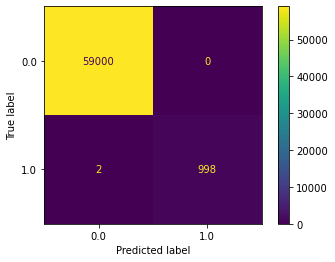


UPSAMPLED TRAIN DATA : Confusion Matrix
[[59000     0]
 [    2 58998]]


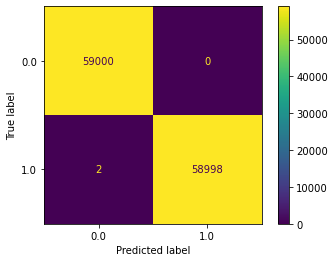

TEST DATA : Confusion Matrix
[[15578    47]
 [   66   309]]


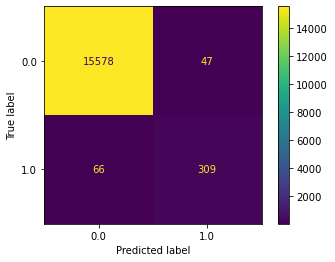


TRAIN DATA - Total misclassifications: 2

UPSAMPLED TRAIN DATA - Total misclassifications: 2
TEST DATA - Total misclassifications: 113
TRAIN DATA-Misclassification rate 3.33e-05
UPSAMPLED TRAIN DATA-Misclassification rate 1.69e-05
TEST DATA-Misclassification rate 0.0070625


In [23]:
 def printStats_XGB_sm(imputed_trainY,xgb_train_PredY,imputed_testY, xgb_test_PredY,y_train_upsample,xgb_pred_sm_tr_y,model): 
    xgb_train_accuracy = accuracy_score(imputed_trainY, xgb_train_PredY)
    xgb_test_accuracy = accuracy_score(imputed_testY, xgb_test_PredY)
    train_sm_accuracy = accuracy_score(y_train_upsample,xgb_pred_sm_tr_y)
    print("Train Accuracy:",xgb_train_accuracy)
    print("Upsampled train data: train accuracy", train_sm_accuracy)
    print("Test Accuracy:",xgb_test_accuracy)
    
    print("Train Error - Misclassification rate : ", np.round(1-xgb_train_accuracy,7))
    print("Upsampled train data:Train Error - Misclassification rate : ", np.round(1- train_sm_accuracy,7))
    print("Test Error - Misclassification rate : ", 1-xgb_test_accuracy)

    xgb_train_cm = confusion_matrix(imputed_trainY, xgb_train_PredY)
    xgb_train_TN, xgb_train_FP, xgb_train_FN, xgb_train_TP = xgb_train_cm.ravel()
    print("\nTRAIN DATA : Confusion Matrix")
    print(xgb_train_cm)

    disp = ConfusionMatrixDisplay(confusion_matrix= xgb_train_cm,display_labels=model.classes_)
    disp.plot()
    plt.show()

    sm_xgb_train_cm = confusion_matrix(y_train_upsample,xgb_pred_sm_tr_y)
    xgb_sm_train_TN, xgb_sm_train_FP, xgb_sm_train_FN, xgb_sm_train_TP = sm_xgb_train_cm.ravel()
    print("\nUPSAMPLED TRAIN DATA : Confusion Matrix")
    print(sm_xgb_train_cm)

    disp = ConfusionMatrixDisplay(confusion_matrix= sm_xgb_train_cm,display_labels=model.classes_)
    disp.plot()
    plt.show()
    
    
    xgb_test_cm = confusion_matrix(imputed_testY, xgb_test_PredY)
    xgb_test_TN, xgb_test_FP, xgb_test_FN, xgb_test_TP = xgb_test_cm.ravel()
    print("TEST DATA : Confusion Matrix")
    print(xgb_test_cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix= xgb_test_cm,display_labels=model.classes_)
    disp.plot()
    plt.show()

    tr_mc=xgb_train_FP+xgb_train_FN
    sm_tr_mc=xgb_sm_train_FP+xgb_sm_train_FN
    te_mc=xgb_test_FP+xgb_test_FN
    print("\nTRAIN DATA - Total misclassifications:",tr_mc)
    print("\nUPSAMPLED TRAIN DATA - Total misclassifications:",sm_tr_mc)
    print("TEST DATA - Total misclassifications:",te_mc)

    print("TRAIN DATA-Misclassification rate",np.round(tr_mc/(xgb_train_TN+xgb_train_FP+xgb_train_FN+xgb_train_TP),7))
    print("UPSAMPLED TRAIN DATA-Misclassification rate",np.round(sm_tr_mc/(xgb_sm_train_TN+xgb_sm_train_FP+xgb_sm_train_FN+xgb_sm_train_TP),7))
    print("TEST DATA-Misclassification rate",te_mc/(xgb_test_TN+xgb_test_FP+xgb_test_FN+xgb_test_TP))

    
printStats_XGB_sm(imputed_trainY,xgb_pred_tr_y,imputed_testY, xgb_pred_te_y,y_train_upsample,xgb_pred_sm_tr_y,gsv_smote)

In [24]:
print("TRAIN DATA")
print(classification_report(imputed_trainY,xgb_pred_tr_y))
print("\nUPSAMPLED TRAIN DATA")
print(classification_report(y_train_upsample,xgb_pred_sm_tr_y))
print("\nTEST DATA")
print(classification_report(imputed_testY,xgb_pred_te_y))

print("TRAIN DATA- F1 score", f1_score(imputed_trainY,xgb_pred_tr_y))
print("UPSAMPLED TRAIN DATA- F1 score", f1_score(y_train_upsample,xgb_pred_sm_tr_y))
print("TEST DATA- F1 score", f1_score(imputed_testY,xgb_pred_te_y))

TRAIN DATA
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     59000
         1.0       1.00      1.00      1.00      1000

    accuracy                           1.00     60000
   macro avg       1.00      1.00      1.00     60000
weighted avg       1.00      1.00      1.00     60000


UPSAMPLED TRAIN DATA
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     59000
         1.0       1.00      1.00      1.00     59000

    accuracy                           1.00    118000
   macro avg       1.00      1.00      1.00    118000
weighted avg       1.00      1.00      1.00    118000


TEST DATA
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     15625
         1.0       0.87      0.82      0.85       375

    accuracy                           0.99     16000
   macro avg       0.93      0.91      0.92     16000
weighted avg       0.99      0

In [25]:
sm_xgb_model_train_PredY_prob = gsv_smote.predict_proba(imputed_trainX)
sm_xgb_model_test_PredY_prob = gsv_smote.predict_proba(imputed_testX)
sm_xgb_model_train_smote_PredY_prob = gsv_smote.predict_proba(X_train_upsample)

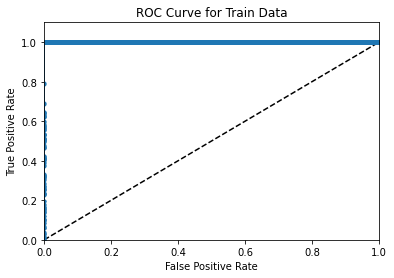

AUC for TRAIN DATA: 1.0


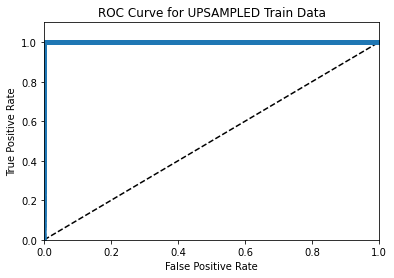

AUC for UPSAMPLED TRAIN DATA: 1.0


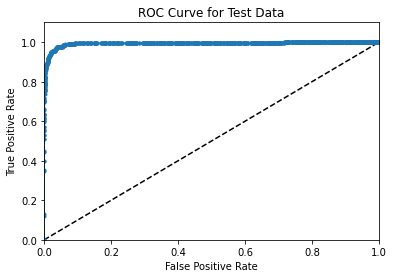

AUC for TEST DATA: 0.994


In [28]:
def plot_roc_auc_smote(imputed_trainY,xgb_model_train_PredY_prob,imputed_testY, xgb_model_test_PredY_prob,y_train_upsample,sm_xgb_model_train_smote_PredY_prob):
    xgb_tr_fpr,xgb_tr_tpr,threshold = roc_curve(imputed_trainY,xgb_model_train_PredY_prob[:, 1])
    xgb_train_auc = round(roc_auc_score(imputed_trainY,xgb_model_train_PredY_prob[:, 1]), 3)
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.plot(xgb_tr_fpr,xgb_tr_tpr,marker='.')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.1])
    plt.title("ROC Curve for Train Data")
    plt.show()
    print("AUC for TRAIN DATA:", xgb_train_auc)

    xgb_tr_fpr,xgb_tr_tpr,threshold = roc_curve(y_train_upsample,sm_xgb_model_train_smote_PredY_prob[:, 1])
    xgb_train_auc = round(roc_auc_score(y_train_upsample,sm_xgb_model_train_smote_PredY_prob[:, 1]), 3)
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.plot(xgb_tr_fpr,xgb_tr_tpr,marker='.')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.1])
    plt.title("ROC Curve for UPSAMPLED Train Data")
    plt.show()
    print("AUC for UPSAMPLED TRAIN DATA:", xgb_train_auc)
    
    xgb_te_fpr,xgb_te_tpr,threshold = roc_curve(imputed_testY,xgb_model_test_PredY_prob[:,1])
    xgb_test_auc = round(roc_auc_score(imputed_testY,xgb_model_test_PredY_prob[:,1]), 3)
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.plot(xgb_te_fpr,xgb_te_tpr,marker='.')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.1])
    plt.title("ROC Curve for Test Data")
    plt.show()
    print("AUC for TEST DATA:", xgb_test_auc)
    
    

plot_roc_auc_smote(imputed_trainY,sm_xgb_model_train_PredY_prob ,imputed_testY, sm_xgb_model_test_PredY_prob,y_train_upsample,sm_xgb_model_train_smote_PredY_prob)

## Observations

For both cases (non SMOTE and SMOTE), the train AUC and accuracy remains the same.<br>
With SMOTE, the model would be a better one (better prediction) in general, since a balance of classes are considered. <br> 
When we test the model with SMOTE with a diverse set of test sets, the model with balanced classes would perform better.
AUC for test data in SMOTE case is 0.994 whereas 0.996 in non SMOTE case. With this test set, test score in SMOTE is slightly lesser than test score in the previous model without SMOTE.
We could see that misclassification rate is slightly more in the SMOTE model

## ISLR 6.6.3, ISLR 6.6.5,  ISLR 8.4.5, ISLR 9.7.3

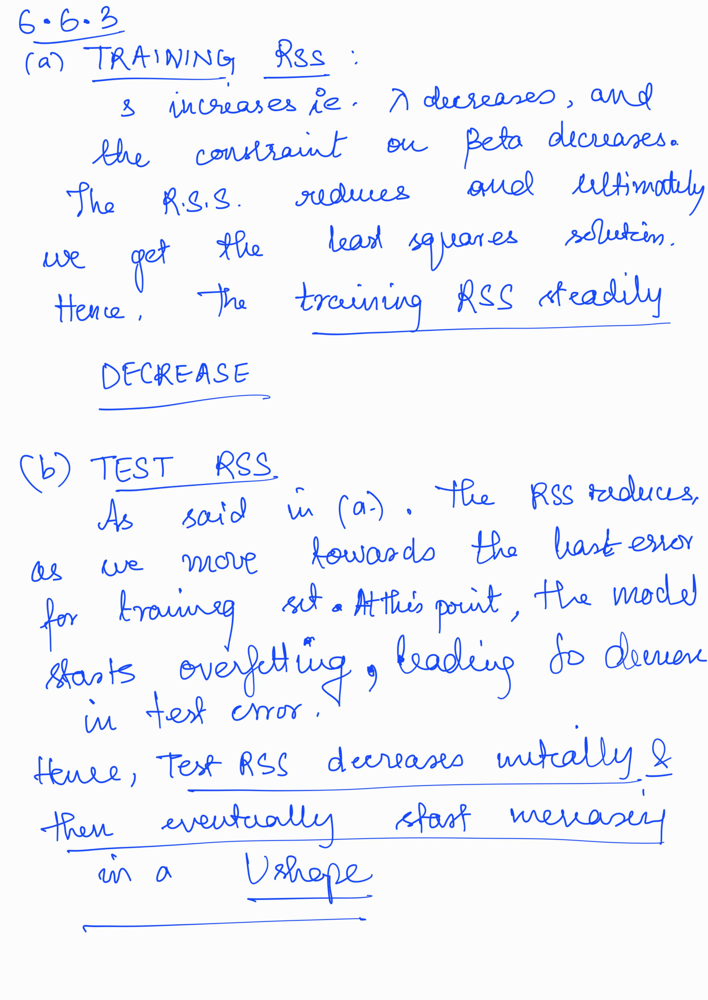


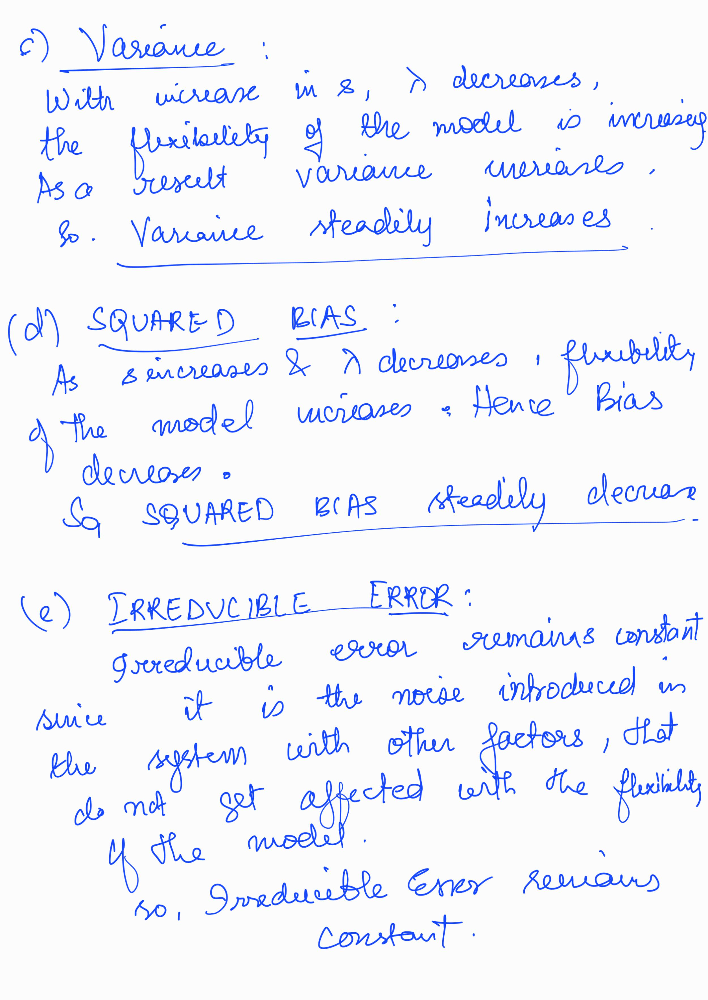

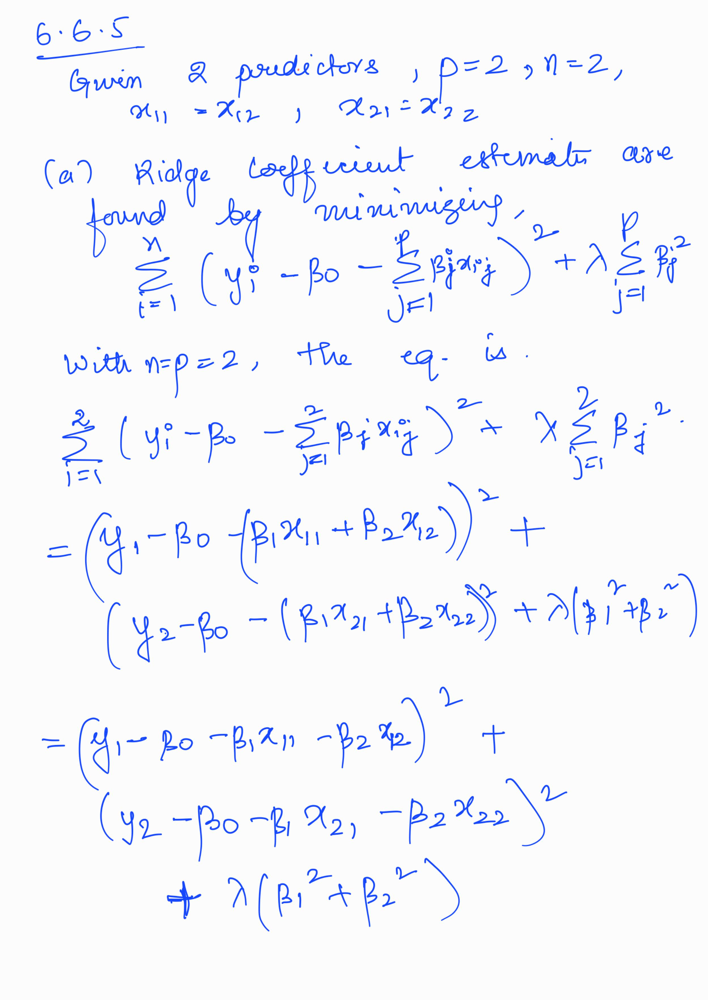

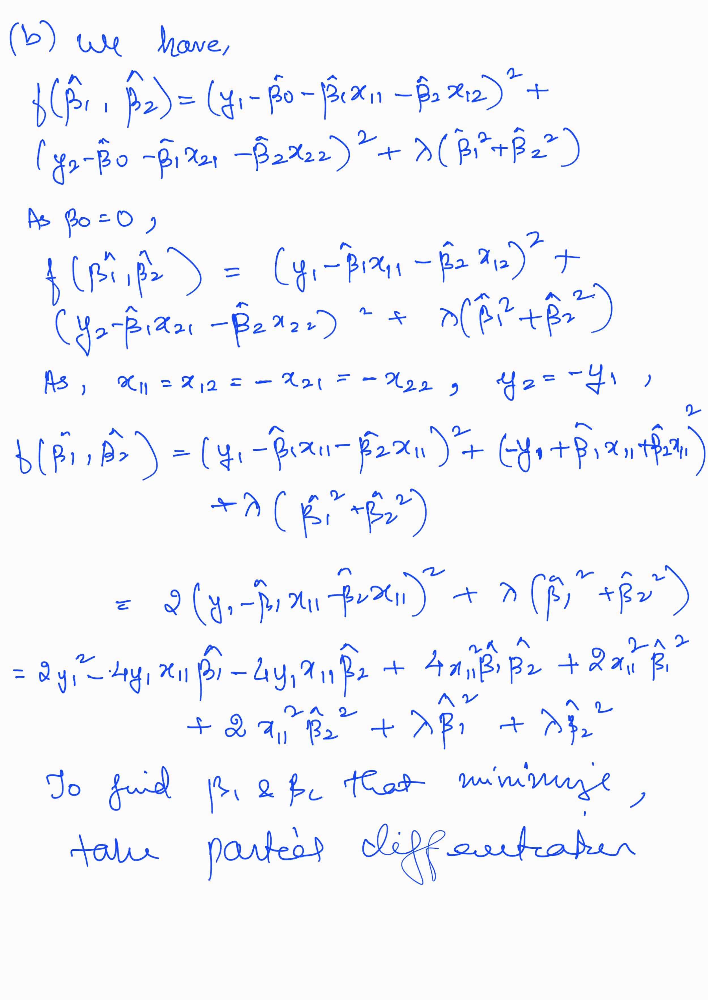

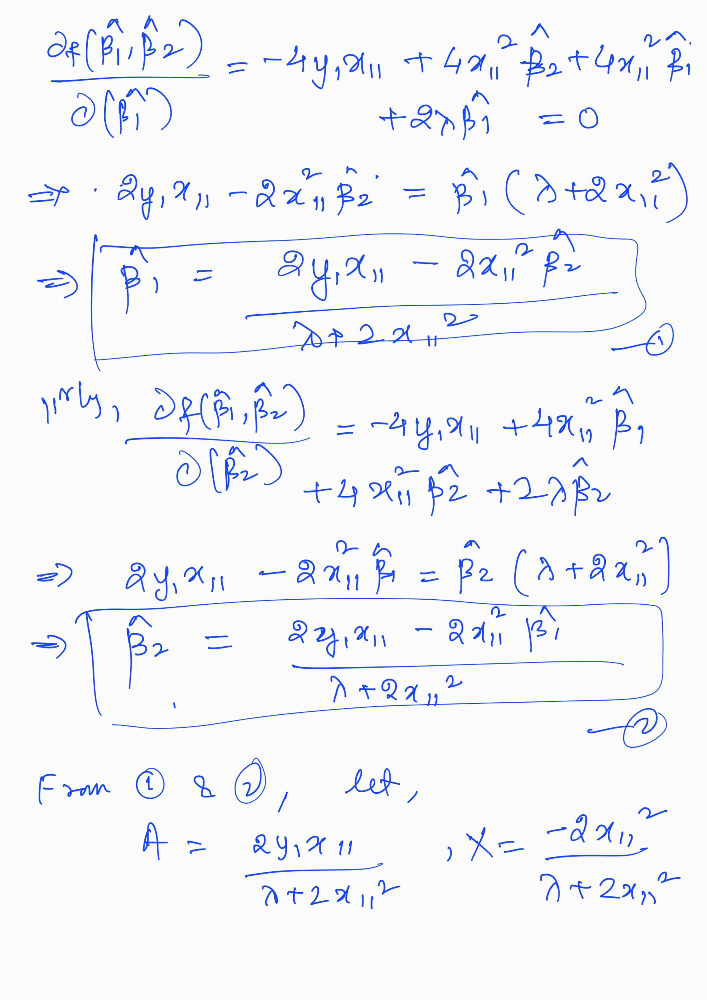

...

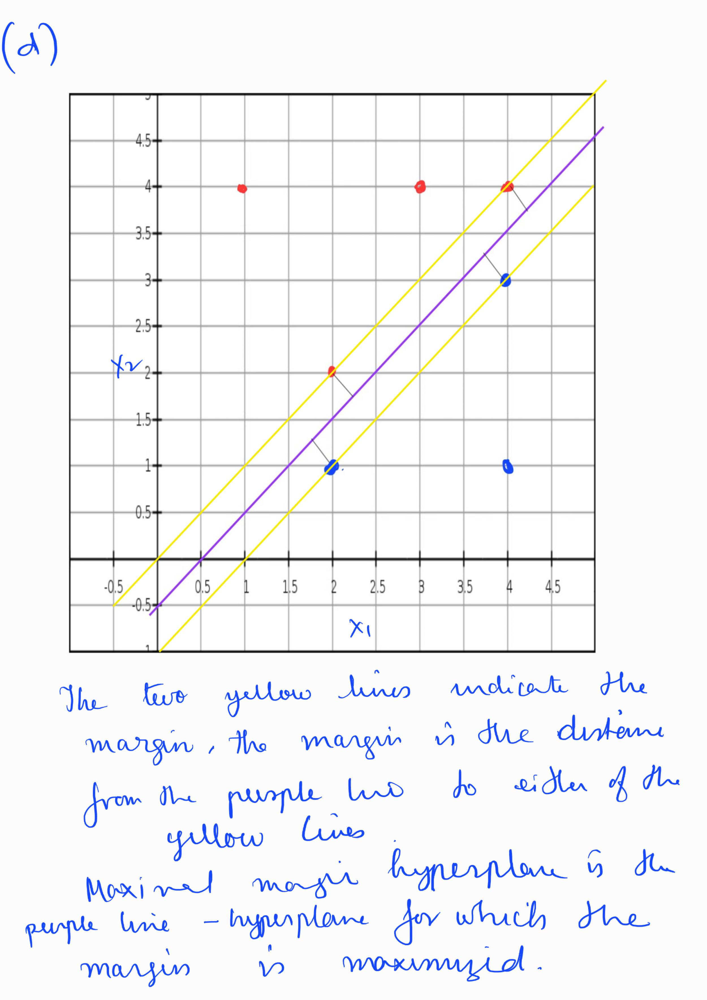

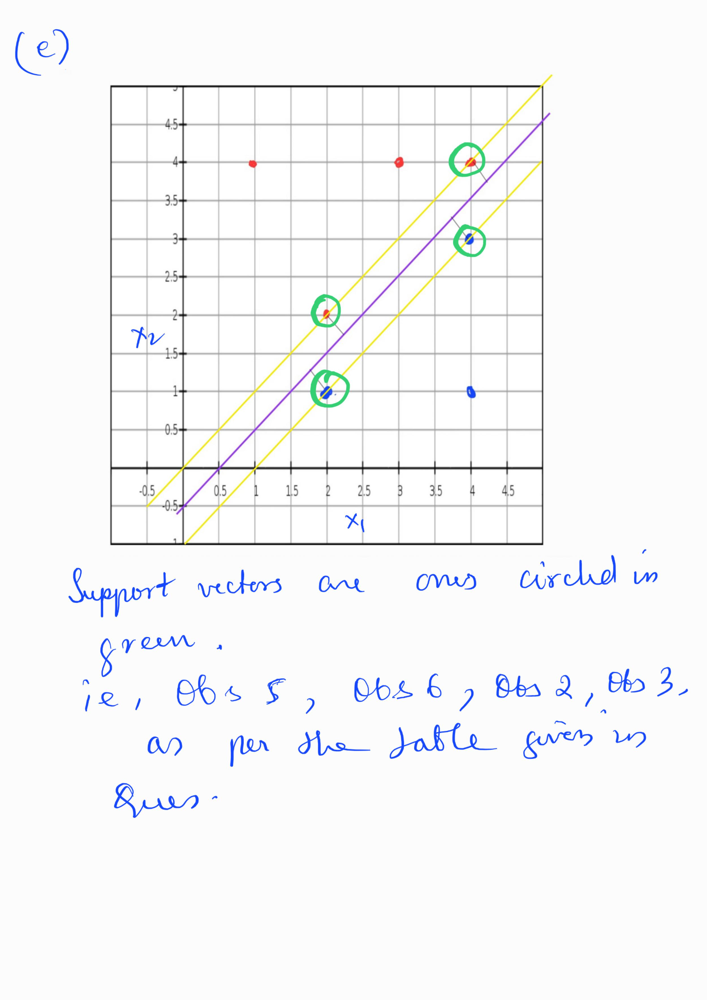

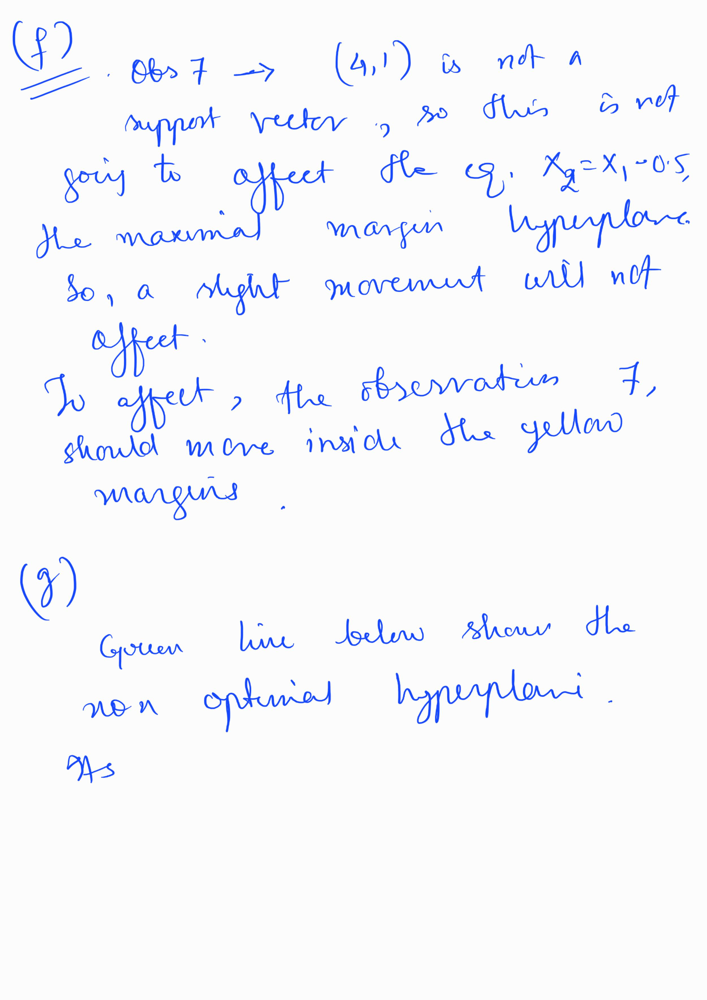

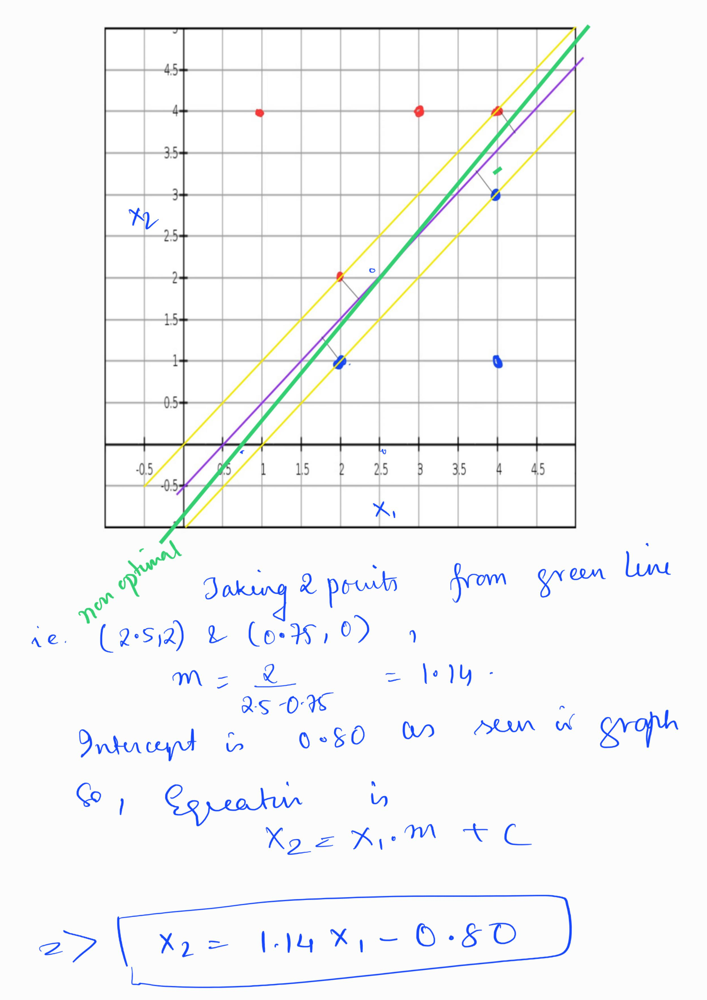

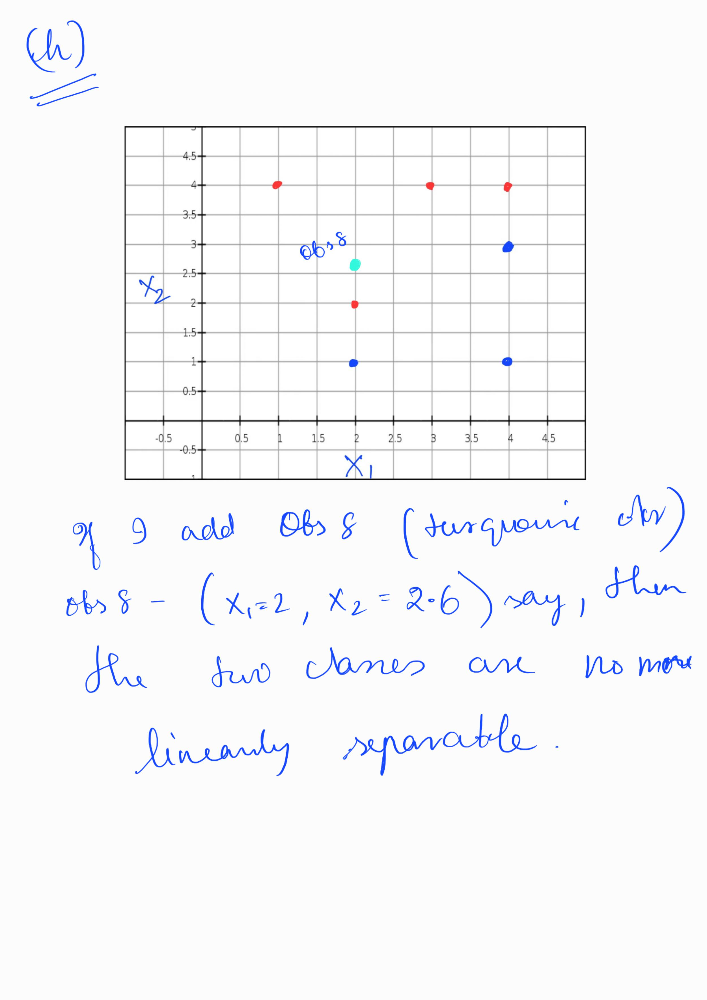

## REFERENCES


https://www.researchgate.net/post/should_oversampling_be_done_before_or_within_cross-validation
https://towardsdatascience.com/7-ways-to-handle-missing-values-in-machine-learning-1a6326adf79e
https://www.analyticsvidhya.com/blog/2021/10/handling-missing-value/
https://www.analyticsvidhya.com/blog/2020/12/out-of-bag-oob-score-in-the-random-forest-algorithm/
https://kiwidamien.github.io/how-to-do-cross-validation-when-upsampling-data.html

## Using Random Forest Classifier with BALANCED SUBSAMPLE

RANDOM FOREST MODEL - BALANCED CLASSES
Train Accuracy: 1.0
Test Accuracy: 0.989125
Train Error - Misclassification rate :  0.0
Test Error - Misclassification rate :  0.010874999999999968

TRAIN DATA : Confusion Matrix
[[59000     0]
 [    0  1000]]


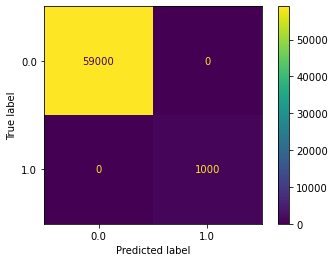

TEST DATA : Confusion Matrix
[[15610    15]
 [  159   216]]


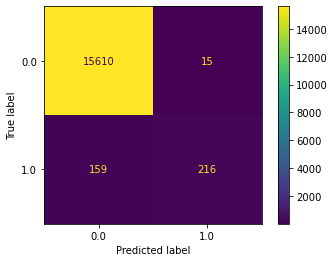


TRAIN DATA - Total misclassifications: 0
TEST DATA - Total misclassifications: 174
TRAIN DATA-Misclassification rate 0.0
TEST DATA-Misclassification rate 0.010875

 Balanced - Out of the bag error: 0.007883333333333353
RANDOM FOREST MODEL - BALANCED CLASSES


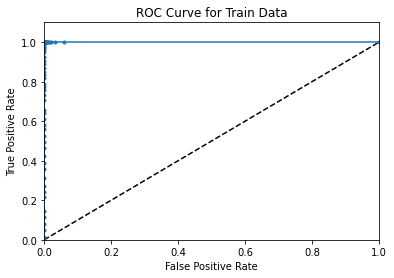

AUC for TRAIN DATA: 1.0


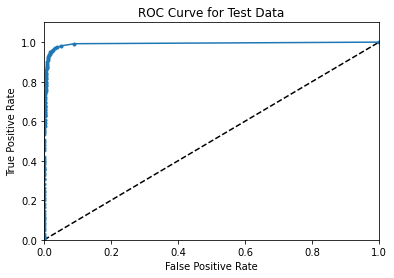

AUC for TEST DATA: 0.992


In [43]:
def printStats(imputed_trainY,train_PredY,imputed_testY, test_PredY,model): 
    rf_train_accuracy = accuracy_score(imputed_trainY, train_PredY)
    rf_test_accuracy = accuracy_score(imputed_testY, test_PredY)
    print("Train Accuracy:",rf_train_accuracy)
    print("Test Accuracy:",rf_test_accuracy)
    print("Train Error - Misclassification rate : ", 1-rf_train_accuracy)
    print("Test Error - Misclassification rate : ", 1-rf_test_accuracy)

    rf_train_cm = confusion_matrix(imputed_trainY, train_PredY)
    rf_train_TN, rf_train_FP, rf_train_FN, rf_train_TP = rf_train_cm.ravel()
    print("\nTRAIN DATA : Confusion Matrix")
    print(rf_train_cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=rf_train_cm,display_labels=model.classes_)
    disp.plot()
    plt.show()

    rf_test_cm = confusion_matrix(imputed_testY, test_PredY)
    rf_test_TN, rf_test_FP, rf_test_FN, rf_test_TP = rf_test_cm.ravel()
    print("TEST DATA : Confusion Matrix")
    print(rf_test_cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=rf_test_cm,display_labels=model.classes_)
    disp.plot()
    plt.show()

    tr_mc=rf_train_FP+rf_train_FN
    te_mc=rf_test_FP+rf_test_FN
    print("\nTRAIN DATA - Total misclassifications:",tr_mc)
    print("TEST DATA - Total misclassifications:",te_mc)

    print("TRAIN DATA-Misclassification rate",tr_mc/(rf_train_TN+rf_train_FP+rf_train_FN+rf_train_TP))
    print("TEST DATA-Misclassification rate",te_mc/(rf_test_TN+rf_test_FP+rf_test_FN+rf_test_TP))
    
    
    
balanced_rfm_bs = RandomForestClassifier(n_estimators=100,class_weight='balanced_subsample', oob_score = True,n_jobs=-1, random_state=16)
balanced_rfm_bs = balanced_rfm_bs.fit(imputed_trainX, imputed_trainY)

balanced_rf_train_PredY_bs = balanced_rfm_bs.predict(imputed_trainX)
balanced_rf_test_PredY_bs = balanced_rfm_bs.predict(imputed_testX)

print("RANDOM FOREST MODEL - BALANCED CLASSES")
printStats(imputed_trainY,balanced_rf_train_PredY_bs,imputed_testY, balanced_rf_test_PredY_bs, balanced_rfm_bs)
bal_oob_error_bs = 1-balanced_rfm_bs.oob_score_
print('\n Balanced - Out of the bag error:', bal_oob_error_bs)

balanced_rf_train_PredY_prob_bs = balanced_rfm_bs.predict_proba(imputed_trainX)
balanced_rf_test_PredY_prob_bs = balanced_rfm_bs.predict_proba(imputed_testX)


print("RANDOM FOREST MODEL - BALANCED CLASSES")
plot_roc_auc(imputed_trainY,balanced_rf_train_PredY_prob_bs,imputed_testY, balanced_rf_test_PredY_prob_bs)

## Using Random Forest Classifier with BalancedRandomForestClassifier

RANDOM FOREST MODEL - BALANCED CLASSES
Train Accuracy: 0.9464166666666667
Test Accuracy: 0.94725
Train Error - Misclassification rate :  0.053583333333333316
Test Error - Misclassification rate :  0.052749999999999964

TRAIN DATA : Confusion Matrix
[[55785  3215]
 [    0  1000]]


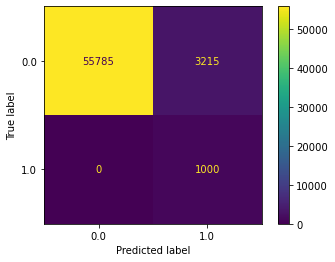

TEST DATA : Confusion Matrix
[[14793   832]
 [   12   363]]


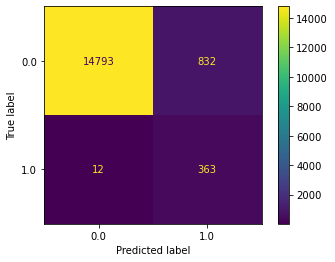


TRAIN DATA - Total misclassifications: 3215
TEST DATA - Total misclassifications: 844
TRAIN DATA-Misclassification rate 0.05358333333333333
TEST DATA-Misclassification rate 0.05275

 Balanced - Out of the bag error: 0.06868073692383714
RANDOM FOREST MODEL - BALANCED CLASSES


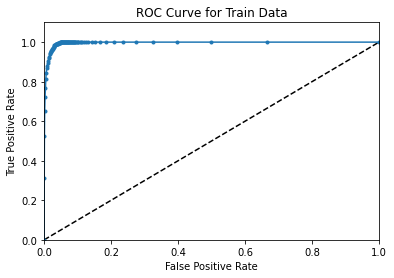

AUC for TRAIN DATA: 0.996


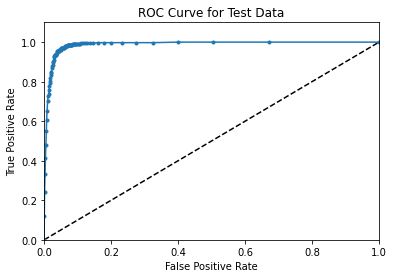

AUC for TEST DATA: 0.988


In [44]:
from imblearn.ensemble import BalancedRandomForestClassifier

balanced_rfm_bs = BalancedRandomForestClassifier(n_estimators=100,class_weight='balanced', oob_score = True,n_jobs=-1, random_state=16)

# balanced_rfm_bs = RandomForestClassifier(n_estimators=200,class_weight='balanced_subsample', oob_score = True,n_jobs=-1, random_state=16)
balanced_rfm_bs = balanced_rfm_bs.fit(imputed_trainX, imputed_trainY)

balanced_rf_train_PredY_bs = balanced_rfm_bs.predict(imputed_trainX)
balanced_rf_test_PredY_bs = balanced_rfm_bs.predict(imputed_testX)

print("RANDOM FOREST MODEL - BALANCED CLASSES")
printStats(imputed_trainY,balanced_rf_train_PredY_bs,imputed_testY, balanced_rf_test_PredY_bs, balanced_rfm_bs)
bal_oob_error_bs = 1-balanced_rfm_bs.oob_score_
print('\n Balanced - Out of the bag error:', bal_oob_error_bs)

balanced_rf_train_PredY_prob_bs = balanced_rfm_bs.predict_proba(imputed_trainX)
balanced_rf_test_PredY_prob_bs = balanced_rfm_bs.predict_proba(imputed_testX)


print("RANDOM FOREST MODEL - BALANCED CLASSES")
plot_roc_auc(imputed_trainY,balanced_rf_train_PredY_prob_bs,imputed_testY, balanced_rf_test_PredY_prob_bs)
